In [15]:
import pandas as pd
import os.path as op
from tqdm.contrib.itertools import product
import numpy as np
import seaborn as sns
from tms_risk.utils import get_subjects
from tms_risk.utils.data import get_all_apriori_roi_labels

In [16]:
def get_cvr2(subject, session, mask='npcr', bids_folder='/data/ds-tmsrisk'):
    subject = int(subject)

    fn = op.join(bids_folder, 'derivatives', 'decoded_pdfs.volume.cv_voxel_selection.denoise.natural_space', f'sub-{subject:02d}',
    'func', f'sub-{subject:02d}_ses-{session}_mask-{mask}_space-T1w_r2s.tsv')

    if op.exists(fn):
        df = pd.read_csv(fn, sep='\t', index_col=[0,1,2,3])
        # print(df)
        df['mask'] = mask
        df = df.set_index('mask', append=True)
        return df
    else:
        return pd.DataFrame(np.zeros((0,0)))

In [17]:
subjects = [int(sub.subject) for sub in get_subjects(all_tms_conditions=True)]
# subjects.pop(subjects.index(24))

In [18]:
df = []
for subject, session, mask in product(subjects, ['1', '2', '3'], get_all_apriori_roi_labels()):
    try:
        d = get_cvr2(subject, session, mask)
        d.columns.name = 'voxel'
        if len(d) != 0:
            df.append(d.stack().to_frame('r2'))
        # print(df[-1])
    except Exception as e:
        print(e)

df = pd.concat(df)

  0%|          | 0/1260 [00:00<?, ?it/s]

                                                      0         1         2  \
subject session test_run1 test_run2 mask                                      
1       1       1         2         NPC1l -1.763201e-02 -0.021460 -0.015552   
                          3         NPC1l -3.174267e-01 -0.271617 -0.097866   
                          4         NPC1l -1.491911e-01 -0.184671 -0.213734   
                          5         NPC1l  3.591561e-02 -0.445336 -0.042192   
                          6         NPC1l -2.244650e-01 -0.215853 -0.037472   
                2         1         NPC1l -1.192093e-07 -0.089086 -0.279406   
                          3         NPC1l -3.231775e-01 -0.169092 -0.021286   
                          4         NPC1l -1.714256e-01 -0.258624 -0.506335   
                          5         NPC1l -1.613191e-01 -0.029461 -0.046220   
                          6         NPC1l -2.248547e-01 -0.609402 -0.348633   
                3         1         NPC1l -1.500928e

In [29]:
n_voxels_thr = df.groupby(['subject', 'session', 'test_run1', 'mask', 'voxel']).mean().groupby(['subject', 'session', 'mask', 'test_run1']).apply(lambda d: (d>0.0).sum())


tmp = n_voxels_thr.groupby(['subject', 'session', 'mask']).apply(lambda x: x == 0.0)

# tmp[tmp]

/var/folders/d4/cpqhwlbn301clph1qk64k01nmjkty3/T/ipykernel_97364/3785127038.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  tmp = n_voxels_thr.groupby(['subject', 'session', 'mask']).apply(lambda x: x == 0.0)


In [33]:
tmp[tmp['r2']]

,,,,r2
subject,session,mask,test_run1,
3,3,NF1r,3,True


In [20]:
prop_0 = df.groupby(['subject', 'session', 'test_run1', 'mask', 'voxel']).mean().groupby(['subject', 'session', 'test_run1']).apply(lambda d: (d>0.0).mean())
sum_0 = df.groupby(['subject', 'session', 'test_run1', 'mask', 'voxel']).mean().groupby(['subject', 'session', 'test_run1']).apply(lambda d: (d>0.0).sum())

KeyError: 'roi'

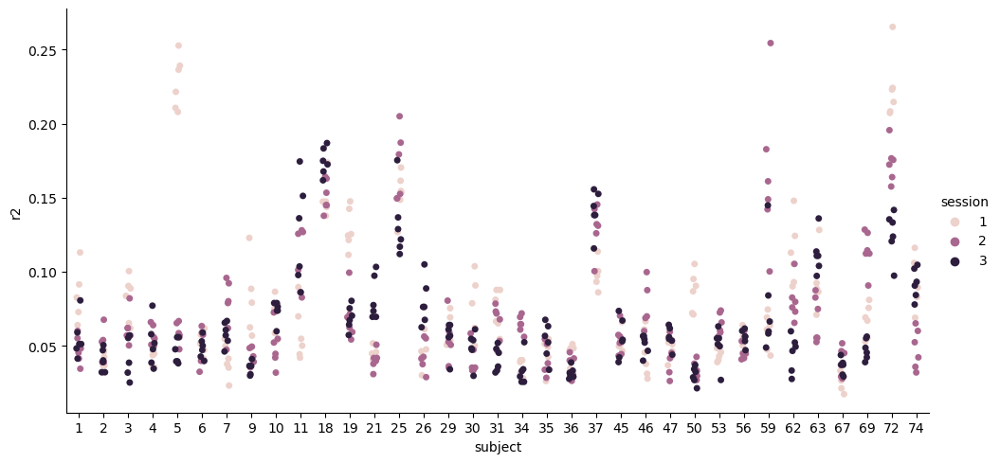

In [9]:
sns.catplot(x='subject', y='r2', hue='session', data=prop_0, aspect=2.)

In [10]:
prop_0.unstack('session').groupby('subject').mean().droplevel(0, axis=1)

session,1,2,3
subject,,,
1,0.080550,0.047315,0.055174
2,0.040999,0.047292,0.040046
3,0.081661,0.061594,0.044036
4,0.042553,0.056738,0.051165
5,0.228034,0.058424,0.045969
6,0.051716,0.048529,0.048529
7,0.040202,0.075960,0.058182
9,0.076434,0.041860,0.035039
10,0.070140,0.049555,0.073486


In [11]:
sum_0.groupby('session').describe()

r2                                                      
         count       mean        std   min   25%   50%    75%    max
session                                                             
1        209.0  70.468900  45.192646  13.0  38.0  54.0  91.00  251.0
2        210.0  63.976190  39.104380  19.0  38.0  51.0  76.75  207.0
3        210.0  60.590476  35.207300  15.0  36.0  50.5  72.50  177.0

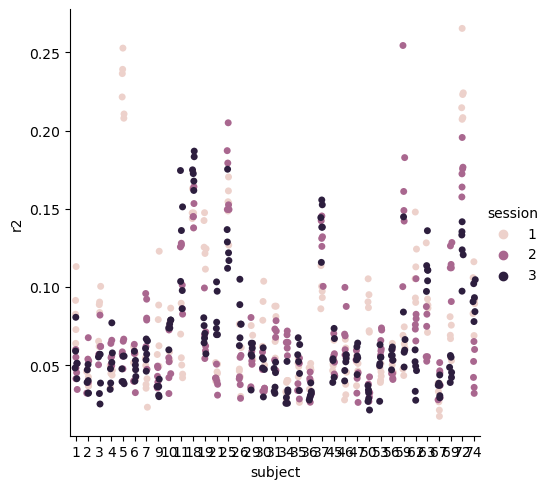

In [12]:
sns.catplot(x='subject', y='r2', hue='session', data=prop_0)

NameError: name 'plt' is not defined

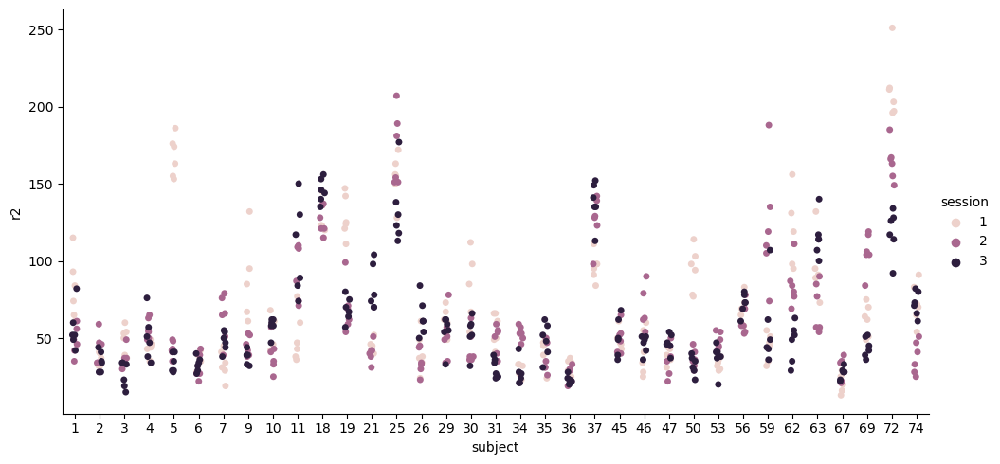

In [13]:
sns.catplot(x='subject', y='r2', hue='session', data=sum_0, aspect=2.)
plt.ylabel('Optimal number of voxels according to CV2-r2')

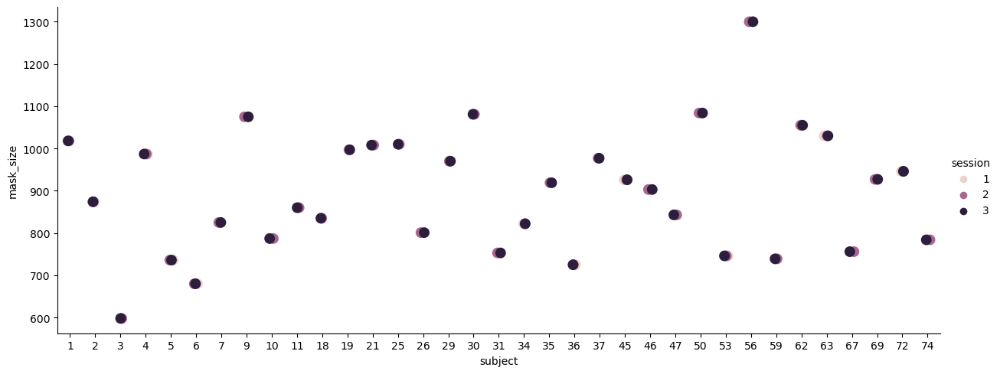

In [14]:
mask_size = df.groupby(['subject', 'session', 'voxel']).mean().groupby(['subject', 'session']).size()

sns.catplot(x='subject', y='mask_size', hue='session', data=mask_size.to_frame('mask_size'), aspect=2.5, size=10)

/Users/gdehol/mambaforge/lib/python3.10/site-packages/seaborn/regression.py:582: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


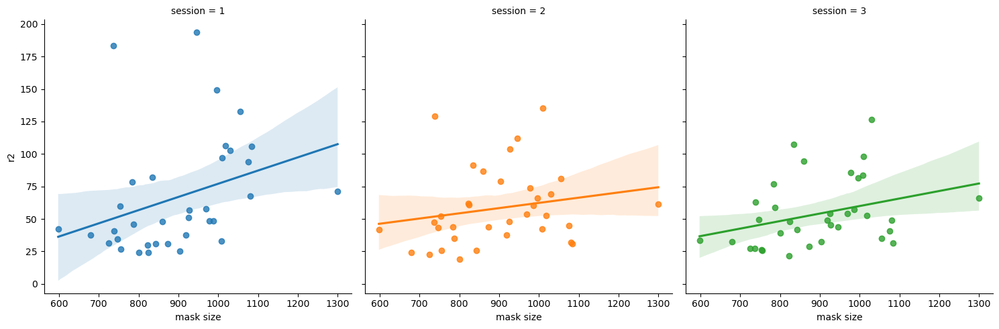

In [64]:
tmp = mask_size.to_frame('mask size').join(sum_0)

sns.lmplot(data=tmp.groupby(['subject', 'session']).mean().reset_index(), x='mask size', y='r2', hue='session', col='session', sharex=False)